In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
import time

# Dataset Class
import torch

class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        # Create a list of valid frame indices that have enough history and future data
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:  # Ensure valid line
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        """Get frames that have sufficient history and future data"""
        all_frames = sorted(self.data.keys())
        valid_frames = []

        for frame in all_frames:
            # Check if we have enough history and future frames
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len

            # Ensure we have data for the required time range
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)

        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]

        # Get all agents present at this frame
        if frame not in self.data:
            # Return empty tensors if no data
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)

        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            # Fill history (going backwards from current frame)
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)  # Fixed indexing
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
                # If no data available, position remains zero (padding)

            # Fill future (going forwards from next frame)
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1  # Start from next frame
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
                # If no data available, position remains zero (padding)

            # Extract goal from the last timestep of future trajectory
            # Find the last non-zero position in future, or use the last timestep
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                # If no future data, use current position as goal
                goals[i] = self.data[frame][agent]

        # Collect neighbors for each agent at the current frame
        neighbors_list = []
        for i, agent in enumerate(agents):
            # Get positions of all other agents at the current frame
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                # If no neighbors, create a dummy neighbor at origin
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        # Pad neighbors to have the same number for all agents
        if neighbors_list:
            max_neighbors = 12  # RKL: hard set this to 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list): #RKL: find all neighbours, sort by distance from ego agent, take top max_neighbours only
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)  # [1, 2]
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)  # [num_neighbors]
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
                else:
                    pass  # No neighbors, leave as zeros
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        return history, future, neighbors, goals


In [ ]:
from torch.nn.utils.rnn import pad_sequence
import torch

def collate_fn(batch):
    """Collate function for batches that include goal"""
    max_agents = max(sample[0].shape[0] for sample in batch)
    # history
    max_neighbors = max(sample[2].shape[1] for sample in batch)  # neighbors
    hist_len = batch[0][0].shape[1]
    fut_len = batch[0][1].shape[1]

    padded_histories = []
    padded_futures = []
    padded_neighbors = []
    padded_goals = []

    for sample in batch:
        history, future, neighbors, goal = sample
        A, H, D = history.shape
        N = neighbors.shape[1]

        padded_hist = torch.zeros(max_agents, hist_len, D)
        padded_fut = torch.zeros(max_agents, fut_len, D)
        padded_neigh = torch.zeros(max_agents, max_neighbors, D)
        padded_goal = torch.zeros(max_agents, D)

        padded_hist[:A] = history
        padded_fut[:A] = future
        padded_neigh[:A, :N] = neighbors
        padded_goal[:A] = goal

        padded_histories.append(padded_hist)
        padded_futures.append(padded_fut)
        padded_neighbors.append(padded_neigh)
        padded_goals.append(padded_goal)

    return (
        torch.stack(padded_histories),   # [B, A, hist_len, D]
        torch.stack(padded_futures),     # [B, A, fut_len, D]
        torch.stack(padded_neighbors),   # [B, A, max_neighbors, D]
        torch.stack(padded_goals)        # [B, A, D]
    )

# FIXED: Added goals to test data (4th element in each tuple)
test_batch = [
    (torch.rand(3, 8, 2), torch.rand(3, 12, 2), torch.rand(3, 5, 2), torch.rand(3, 2)),  # 3 agents with goals
    (torch.rand(2, 8, 2), torch.rand(2, 12, 2), torch.rand(2, 3, 2), torch.rand(2, 2)),  # 2 agents with goals
    (torch.rand(4, 8, 2), torch.rand(4, 12, 2), torch.rand(4, 6, 2), torch.rand(4, 2))   # 4 agents with goals
]

# Now this should work correctly
hist, fut, neigh, goals = collate_fn(test_batch)  # Note: also need to unpack goals here
print(f"History shape: {hist.shape}")     # Will be [3, 4, 8, 2]
print(f"Future shape: {fut.shape}")       # Will be [3, 4, 12, 2]
print(f"Neighbors shape: {neigh.shape}")  # Will be [3, 4, 6, 2]
print(f"Goals shape: {goals.shape}")      # Will be [3, 4, 2]

History shape: torch.Size([3, 4, 8, 2])
Future shape: torch.Size([3, 4, 12, 2])
Neighbors shape: torch.Size([3, 4, 6, 2])
Goals shape: torch.Size([3, 4, 2])


In [ ]:
def calculate_speed(trajectory):
    """Calculate average speed from trajectory tensor [B, A, T, 2]"""
    diffs = trajectory[:, :, 1:, :] - trajectory[:, :, :-1, :]  # Frame-to-frame differences
    speeds = torch.norm(diffs, dim=-1)  # [B, A, T-1]
    valid_mask = speeds > 0
    if valid_mask.sum() > 0:
        avg_speed = speeds[valid_mask].mean()
    else:
        avg_speed = torch.tensor(0.0)
    return avg_speed

def check_speed_violations(predictions, history, min_speed, max_speed):
    """Count speed violations in predicted trajectories"""
    # Get last history position
    last_pos = history[:, :, -1:, :]  # [B, A, 1, 2]

    # Combine last history with predictions for speed calculation
    full_traj = torch.cat([last_pos, predictions], dim=2)  # [B, A, T+1, 2]

    # Calculate speeds
    diffs = full_traj[:, :, 1:, :] - full_traj[:, :, :-1, :]
    speeds = torch.norm(diffs, dim=-1)  # [B, A, T]

    # Count violations
    violations = ((speeds < min_speed) | (speeds > max_speed)).sum().item()
    return violations

## PFM Learnable

In [ ]:
class PotentialField(nn.Module):
    def __init__(self, goal, num_agents=1000, k_init=1.0, repulsion_radius=0.5):
        super().__init__()
        self.register_buffer('goal', torch.tensor(goal, dtype=torch.float32))
        self.repulsion_radius = repulsion_radius
        self.coeff_embedding = nn.Embedding(num_agents, 3)
        self.coeff_embedding.weight.data.fill_(k_init)

    def forward(self, pos, predicted, neighbors, goal, coeffs):
        k1, k2, kr = coeffs[...,0:1], coeffs[...,1:2], coeffs[...,2:3]
        Fg = k1 * (goal - pos)
        Fp = k2 * (predicted[:,:,0,:] - pos)
        diffs = pos.unsqueeze(2) - neighbors
        dists = torch.norm(diffs, dim=-1, keepdim=True) + 1e-6
        mask = (dists < self.repulsion_radius).float()
        Fr = (kr.unsqueeze(2) * diffs / dists.pow(2) * mask).sum(dim=2)
        return Fg + Fp + Fr, coeffs

# === New PFMOnlyModel (replaces LSTM-based model) ===
class PFMOnlyModel(nn.Module):
    def __init__(self, goal=(4.2,4.2), target_avg_speed=4.087,
                 speed_tolerance=0.15, num_agents=1000, dt=0.1):
        super().__init__()
        self.pfm = PotentialField(goal, num_agents)
        if target_avg_speed is None:
            raise ValueError("target_avg_speed required")
        self.min_speed = target_avg_speed * (1 - speed_tolerance)
        self.max_speed = target_avg_speed * (1 + speed_tolerance)
        self.dt = dt

    def apply_speed_constraints(self, preds, last_pos):
        B,A,T,_ = preds.shape
        out = preds.clone()
        cur = last_pos.clone()
        for t in range(T):
            disp = out[:,:,t] - cur
            sp = torch.norm(disp, dim=-1, keepdim=True)
            nz = sp>0
            clipped = torch.clamp(sp, self.min_speed, self.max_speed)
            sp_final = torch.where(nz, clipped, sp)
            dir = disp/(sp+1e-8)
            out[:,:,t] = cur + dir*sp_final
            cur = out[:,:,t].clone()
        # print(out{:,:,-2},out{:,:,-1},torch.norm(out{:,:,-2} - out{:,:,-1}, dim=-1, keepdim=True))    #RKL Add
        return out

    def forward(self, history, neighbors, goal):
        B,A,H,_ = history.shape
        agent_ids = torch.arange(A).repeat(B,1).to(history.device)
        coeffs = self.pfm.coeff_embedding(agent_ids)
        preds = torch.zeros(B,A,12,2,device=history.device)
        cur = history[:,:,-1,:].clone()
        coeff_list=[]
        for t in range(12):
            if t==0 and H>=2:
                vel = history[:,:,-1,:] - history[:,:,-2,:]
                pred_slice = (cur+vel).unsqueeze(2)
            elif t==0:
                pred_slice = cur.unsqueeze(2)
            else:
                pred_slice = preds[:,:,t-1:t,:].clone()
            forces, cstep = self.pfm(cur, pred_slice, neighbors, goal, coeffs)
            nextp = cur + forces*self.dt
            preds[:,:,t] = nextp
            cur = nextp.clone()
            coeff_list.append(cstep)
        preds = self.apply_speed_constraints(preds, history[:,:,-1,:])
        stack = torch.stack(coeff_list,dim=0)
        return preds, stack.mean(), stack.var(unbiased=False)

## PFM not learnable

In [ ]:
import torch
import torch.nn as nn

import torch
import torch.nn as nn

class PotentialFieldNoLearnable(nn.Module):
    def __init__(self, goal, k_goal=1.0, k_pred=0.5, k_repulse=1.0, repulsion_radius=0.5):
        super().__init__()
        self.register_buffer('goal', torch.tensor(goal, dtype=torch.float32))
        self.k_goal = k_goal
        self.k_pred = k_pred
        self.k_repulse = k_repulse
        self.repulsion_radius = repulsion_radius

    def forward(self, pos, predicted, neighbors, goal, coeffs=None):
        # coeffs ignored; use fixed values
        Fg = self.k_goal * (goal - pos)                        # Goal attraction
        Fp = self.k_pred * (predicted[:, :, 0, :] - pos)       # Predicted movement attraction

        diffs = pos.unsqueeze(2) - neighbors                   # [B, A, max_neighbors, 2]
        dists = torch.norm(diffs, dim=-1, keepdim=True) + 1e-6
        mask = (dists < self.repulsion_radius).float()
        Fr = (self.k_repulse * diffs / dists.pow(2) * mask).sum(dim=2)
        # Ignore coeffs, just use fixed constants for each term
        return Fg + Fp + Fr, torch.zeros_like(pos)

class PFMOnlyModelNoLearnable(nn.Module):
    def __init__(self, goal=(4.2, 4.2), target_avg_speed=4.087,
                 speed_tolerance=0.15, dt=0.1,
                 k_goal=1.0, k_pred=0.5, k_repulse=1.0, repulsion_radius=0.5):
        super().__init__()
        self.pfm = PotentialFieldNoLearnable(goal, k_goal, k_pred, k_repulse, repulsion_radius)
        if target_avg_speed is None:
            raise ValueError("target_avg_speed required")
        self.min_speed = target_avg_speed * (1 - speed_tolerance)
        self.max_speed = target_avg_speed * (1 + speed_tolerance)
        self.dt = dt

    def apply_speed_constraints(self, preds, last_pos):
        B, A, T, _ = preds.shape
        out = preds.clone()
        cur = last_pos.clone()
        for t in range(T):
            disp = out[:, :, t] - cur
            sp = torch.norm(disp, dim=-1, keepdim=True)
            nz = sp > 0
            clipped = torch.clamp(sp, self.min_speed, self.max_speed)
            sp_final = torch.where(nz, clipped, sp)
            dir = disp / (sp + 1e-8)
            out[:, :, t] = cur + dir * sp_final
            cur = out[:, :, t].clone()
        return out

    def forward(self, history, neighbors, goal):
        B, A, H, _ = history.shape
        preds = torch.zeros(B, A, 12, 2, device=history.device)
        cur = history[:, :, -1, :].clone()
        for t in range(12):
            if t == 0 and H >= 2:
                vel = history[:, :, -1, :] - history[:, :, -2, :]
                pred_slice = (cur + vel).unsqueeze(2)
            elif t == 0:
                pred_slice = cur.unsqueeze(2)
            else:
                pred_slice = preds[:, :, t-1:t, :].clone()
            forces, _ = self.pfm(cur, pred_slice, neighbors, goal, None)
            nextp = cur + forces * self.dt
            preds[:, :, t] = nextp
            cur = nextp.clone()
        preds = self.apply_speed_constraints(preds, history[:, :, -1, :])
        return preds, None, None


In [ ]:
import gc
import torch
import torch.nn as nn

def train_pfm_model(
    data_path,
    model_save_path,
    model_class,       # now PFMOnlyModel
    dataset_class,
    collate_fn,
    batch_size=32,
    epochs=3,
    learning_rate=1e-3,
    weight_decay=0.0,
    device=None
):
    device = device or torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    dataset = dataset_class(data_path)
    loader =torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    model = model_class().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    # Monitor initial coefficients
    init = model.pfm.coeff_embedding.weight.data.clone()
    print("Initial coeffs sample:", init[:3])

    for epoch in range(epochs):
        model.train()
        for batch_idx, (hist, fut, neigh, goal) in enumerate(loader):
            hist, fut, neigh = hist.to(device), fut.to(device), neigh.to(device)
            goal = fut[:,:,-1,:].to(device)

            optimizer.zero_grad()
            pred, _, _ = model(hist, neigh, goal)
            loss = criterion(pred, fut)
            loss.backward()
            optimizer.step()

            if batch_idx % 50 == 0:
                grads = model.pfm.coeff_embedding.weight.grad
                print(f"[E{epoch+1} B{batch_idx}] Loss={loss:.4f}, GradNorm={grads.norm():.6f}")
                print(" Coeff sample:", model.pfm.coeff_embedding.weight.data[:3])

    torch.save({'model_state_dict': model.state_dict()}, model_save_path)
    print("Model saved to", model_save_path)


if __name__ == "__main__":
    train_pfm_model(
        data_path="/content/combined_annotations.csv",
        model_save_path="/content/pfm_nolearnable_trajectory_model_own.pth",
        model_class=PFMOnlyModelNoLearnable,
        dataset_class=PFM_TrajectoryDataset,
        collate_fn=collate_fn,
        batch_size=8,
        epochs=1
    )

ValueError: optimizer got an empty parameter list

In [ ]:
import pandas as pd
import numpy as np

# 1. PREPROCESS THE TEST DATASET

import pandas as pd
import numpy as np

def convert_and_clean_txt_for_pfm(txt_file, output_txt_file):
    df = pd.read_csv(txt_file, delim_whitespace=True, header=None, names=['frame', 'agent_id', 'x', 'y'])
    df.replace("?", np.nan, inplace=True)
    df.dropna(inplace=True)
    df['frame'] = df['frame'].astype(int)
    df['agent_id'] = df['agent_id'].astype(int)
    df['x'] = df['x'].astype(float)
    df['y'] = df['y'].astype(float)
    df.to_csv(output_txt_file, index=False, header=False)
    print(f"✅ Cleaned and saved formatted txt for PFM dataset: {output_txt_file}")

# Preprocess the raw test dataset
convert_and_clean_txt_for_pfm('/content/combined_annotations.csv', '/content/combined_annotations_cleaned.csv')


/tmp/ipython-input-1853868666.py:10: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(txt_file, delim_whitespace=True, header=None, names=['frame', 'agent_id', 'x', 'y'])


✅ Cleaned and saved formatted txt for PFM dataset: /content/combined_annotations_cleaned.csv


In [ ]:
import torch.nn.functional as F

def compute_ADE(pred, gt):
    return F.mse_loss(pred, gt, reduction='none').sum(dim=2).sqrt().mean().item()

def compute_FDE(pred, gt):
    return F.mse_loss(pred[:, -1], gt[:, -1], reduction='none').sum(dim=1).sqrt().mean().item()

def compute_miss_rate(pred, gt, threshold=2.0):
    final_dist = F.mse_loss(pred[:, -1], gt[:, -1], reduction='none').sum(dim=1).sqrt()
    misses = (final_dist > threshold).float()
    return (misses.sum() / len(misses)).item()

In [ ]:
def test_with_metrics_pfm(model_path, cleaned_txt_file):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    dataset = PFM_TrajectoryDataset(cleaned_txt_file)
    print(f"\n📦 Loaded {len(dataset)} frame samples for evaluation.")

    if len(dataset) == 0:
        print("❌ No valid samples available. Check your preprocessing.")
        return

    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

    model = PFMOnlyModel().to(device)
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    total_ade, total_fde, total_miss = 0.0, 0.0, 0.0
    count = 0

    with torch.no_grad():
        for history, future, neighbors, goal in dataloader:
            history = history.to(device)
            future = future.to(device)
            neighbors = neighbors.to(device)
            goal = goal.to(device)

            pred, _, _ = model(history, neighbors, goal)  # [1, A, 12, 2]
            pred = pred[0]    # [A, 12, 2]
            future = future[0]  # [A, T, 2]

            # Fix length mismatch
            min_len = min(pred.size(1), future.size(1))
            if pred.size(1) != future.size(1):
                print(f"⚠️ Truncating: pred_len={pred.size(1)}, future_len={future.size(1)} → using {min_len}")
            pred = pred[:, :min_len, :]
            future = future[:, :min_len, :]

            ade = torch.norm(pred - future, dim=-1).mean().item()
            fde = torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1).mean().item()
            miss = (torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1) > 2.0).float().mean().item()

            total_ade += ade
            total_fde += fde
            total_miss += miss
            count += 1

    if count == 0:
        print("❌ Evaluation aborted: No samples processed.")
        return

    print(f"\n📊 Evaluation Metrics on Test Dataset:")
    print(f"🔹 Average ADE:  {total_ade / count:.4f}")
    print(f"🔹 Average FDE:  {total_fde / count:.4f}")
    print(f"🔹 Miss Rate:    {total_miss / count:.4f} (threshold: 2m)")

In [ ]:
# Define test dimensions
batch_size = 32
num_agents = 1000
history_len = 8
num_neighbors = 10
goal_dim = 2

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the model
model = PFMOnlyModel(
    goal=(4.2, 4.2),
    target_avg_speed=4.027,
    speed_tolerance=0.15,
    num_agents=1000,
    dt=0.1
).to(device)

# Generate random input tensors
test_input = torch.rand(batch_size, num_agents, history_len, goal_dim)      # [B, A, H, 2]
test_neighbors = torch.rand(batch_size, num_agents, num_neighbors, goal_dim)  # [B, A, N, 2]

# Generate random goals for each agent
test_goal = torch.rand(batch_size, num_agents, goal_dim)  # [B, A, 2]

# Forward pass
output, coeff_mean, coeff_var = model(test_input, test_neighbors, test_goal)

# Output result shapes
print("Output shape:", output.shape)        # Expected: [32, 5, 12, 2]
print("Coeff mean:", coeff_mean.item())
print("Coeff var:", coeff_var.item())

Output shape: torch.Size([32, 1000, 12, 2])
Coeff mean: 1.0
Coeff var: 0.0


In [ ]:
test_with_metrics_pfm(
        '/content/pfm_trajectory_model_own.pth',
        '/content/combined_annotations.csv'
    )


📦 Loaded 681 frame samples for evaluation.

📊 Evaluation Metrics on Test Dataset:
🔹 Average ADE:  33.6485
🔹 Average FDE:  59.6979
🔹 Miss Rate:    0.5321 (threshold: 2m)


In [ ]:
test_with_metrics_pfm(
        '/content/pfm_trajectory_model_own1.pth',
        '/content/combined_annotations.csv'
    )


📦 Loaded 681 frame samples for evaluation.

📊 Evaluation Metrics on Test Dataset:
🔹 Average ADE:  33.6922
🔹 Average FDE:  59.8583
🔹 Miss Rate:    0.5271 (threshold: 2m)


## PFM_non_learnable

In [ ]:
model_no_learnable = PFMOnlyModelNoLearnable(
    goal=(4.2, 4.2),
    target_avg_speed=4.087,
    speed_tolerance=0.15,
    dt=0.1,
    k_goal=1.0,
    k_pred=0.5,
    k_repulse=1.0,
    repulsion_radius=0.5,
)

In [ ]:
def test_with_metrics_pfm_nontrainable(cleaned_txt_file):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    dataset = PFM_TrajectoryDataset(cleaned_txt_file)
    print(f"\n📦 Loaded {len(dataset)} frame samples for evaluation.")

    if len(dataset) == 0:
        print("❌ No valid samples available. Check your preprocessing.")
        return

    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

    # Instantiate NON-TRAINABLE PFM model (replace with your custom args as needed)
    model = PFMOnlyModelNoLearnable().to(device)
    model.eval()

    total_ade, total_fde, total_miss = 0.0, 0.0, 0.0
    count = 0

    with torch.no_grad():
        for history, future, neighbors, goal in dataloader:
            history = history.to(device)
            future = future.to(device)
            neighbors = neighbors.to(device)
            goal = goal.to(device)

            pred, _, _ = model(history, neighbors, goal)  # [1, A, 12, 2]
            pred = pred[0]    # [A, 12, 2]
            future = future[0]  # [A, T, 2] # FIX: Squeeze future as well

            min_len = min(pred.size(1), future.size(1))
            if min_len < 1:
                continue  # Skip samples with no overlap
            if future.size(1) < pred.size(1):
                print(f"⚠️ Skipping: future_len={future.size(1)} < pred_len={pred.size(1)}")
                continue

            # Truncate both to min_len (should be 12, almost always)
            pred = pred[:, :min_len, :]
            future = future[:, :min_len, :]

            ade = torch.norm(pred - future, dim=-1).mean().item()
            fde = torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1).mean().item()
            miss = (torch.norm(pred[:, -1, :] - future[:, -1, :], dim=-1) > 2.0).float().mean().item()

            total_ade += ade
            total_fde += fde
            total_miss += miss
            count += 1


    if count == 0:
        print("❌ Evaluation aborted: No samples processed.")
        return

    print(f"\n📊 Evaluation Metrics on Test Dataset:")
    print(f"🔹 Average ADE:  {total_ade / count:.4f}")
    print(f"🔹 Average FDE:  {total_fde / count:.4f}")
    print(f"🔹 Miss Rate:    {total_miss / count:.4f} (threshold: 2m)")

In [ ]:
test_with_metrics_pfm_nontrainable('/content/combined_annotations.csv')


📦 Loaded 681 frame samples for evaluation.

📊 Evaluation Metrics on Test Dataset:
🔹 Average ADE:  33.7182
🔹 Average FDE:  59.9488
🔹 Miss Rate:    0.5254 (threshold: 2m)


## Plot not learnable

/tmp/ipython-input-1132954317.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', num_agents)


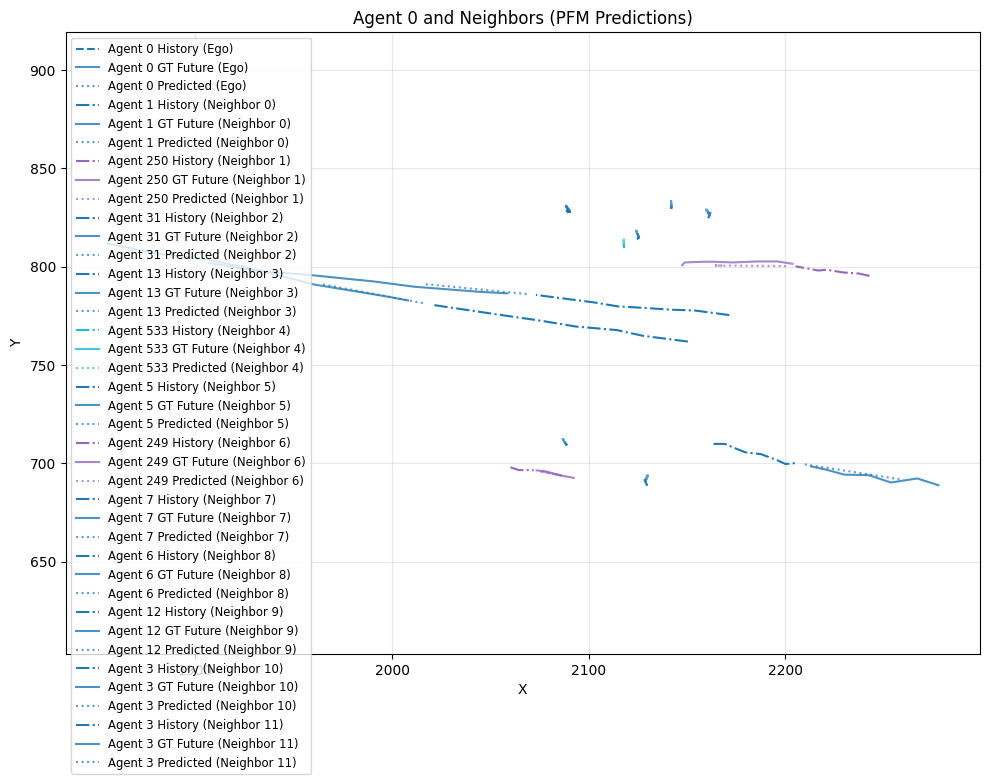

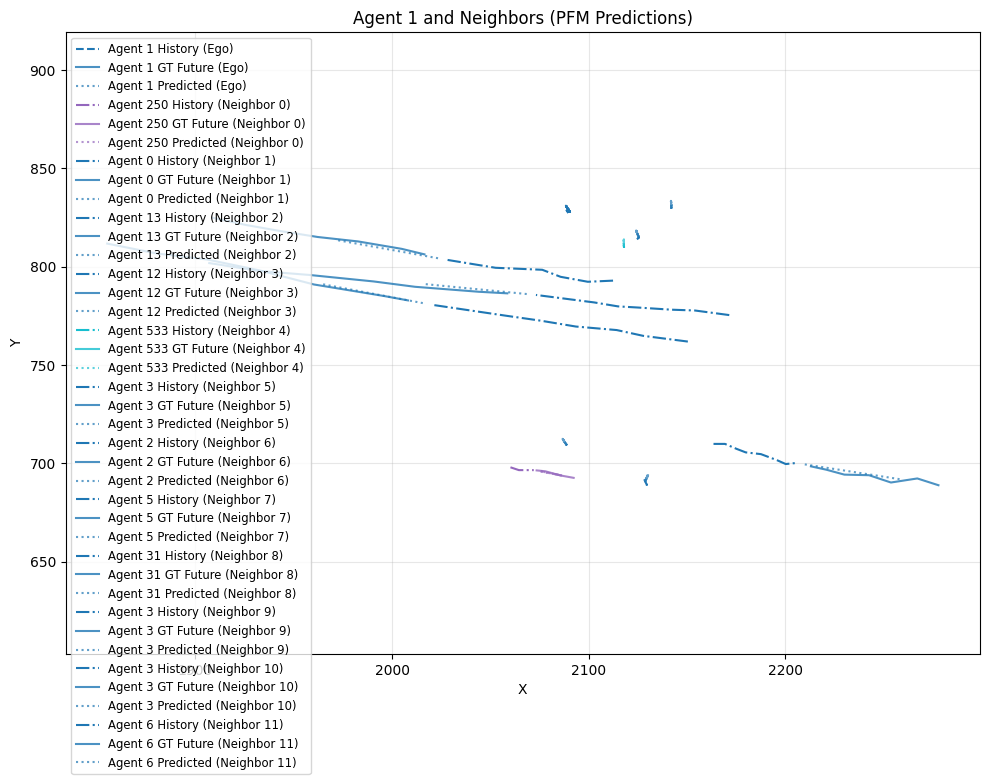

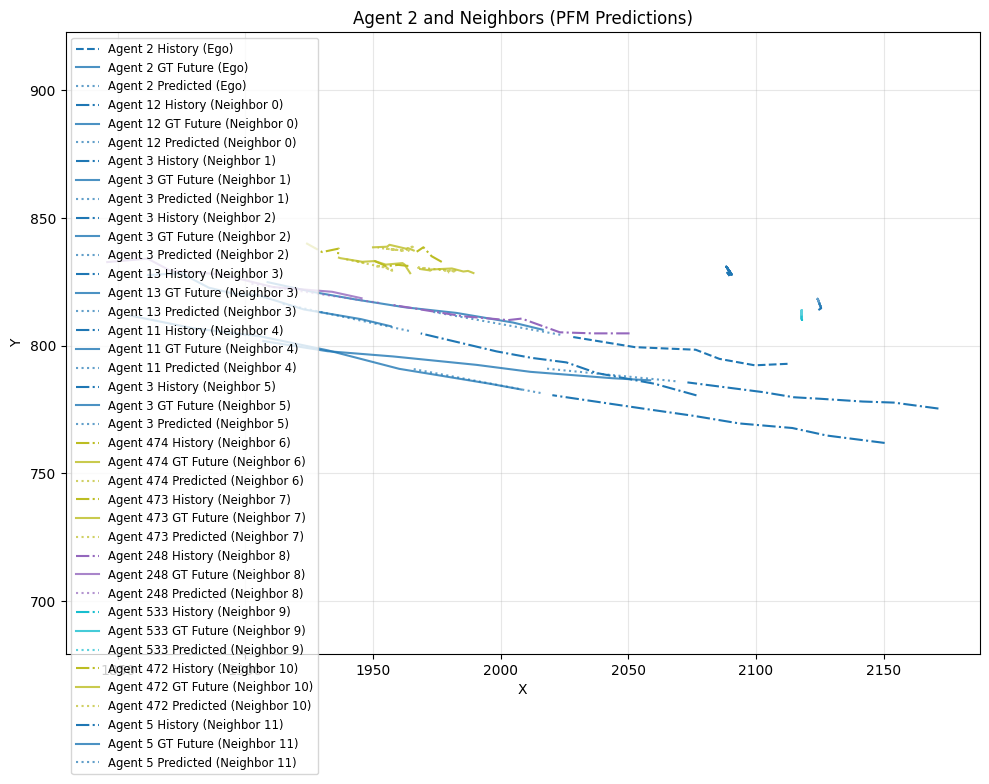

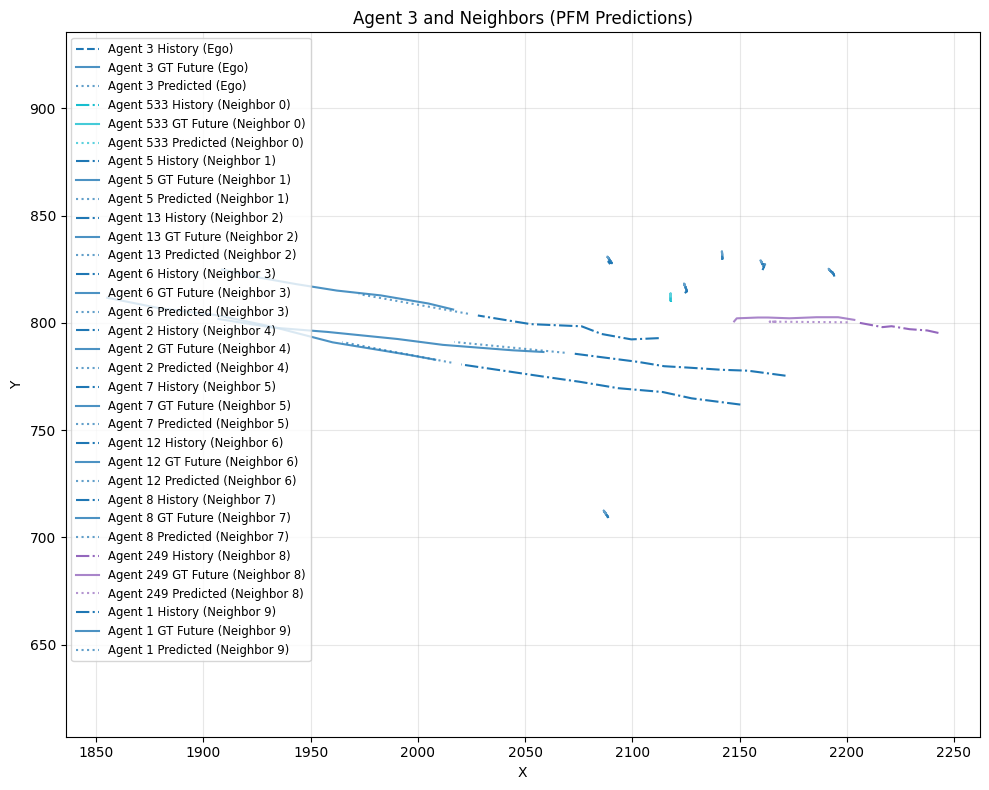

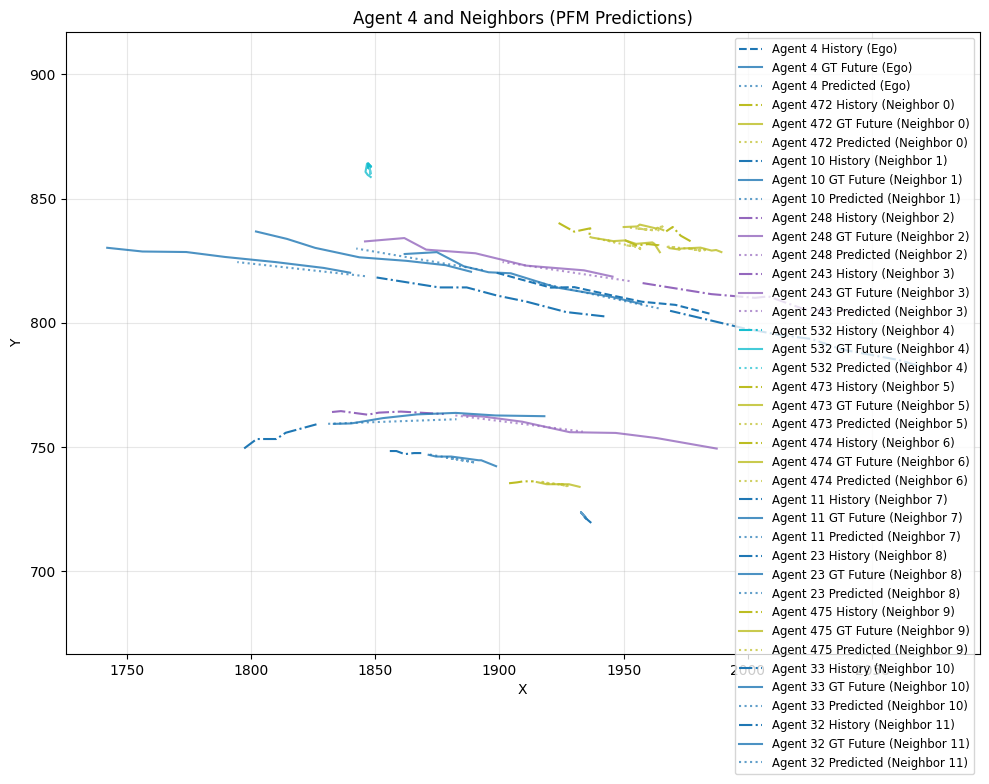

...

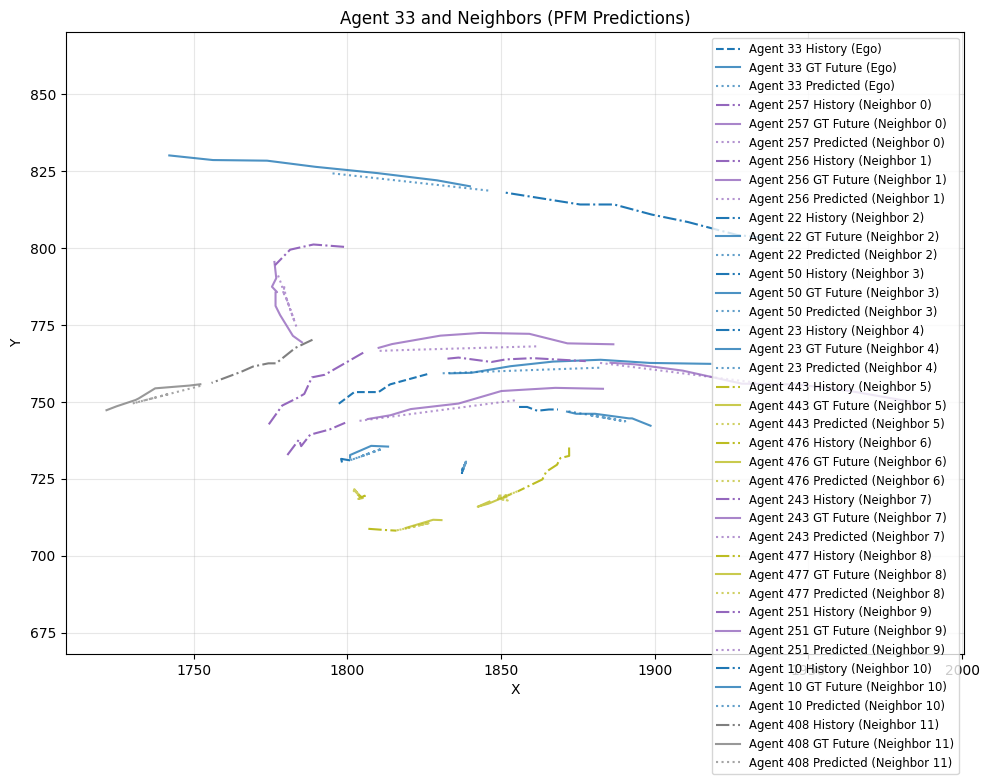

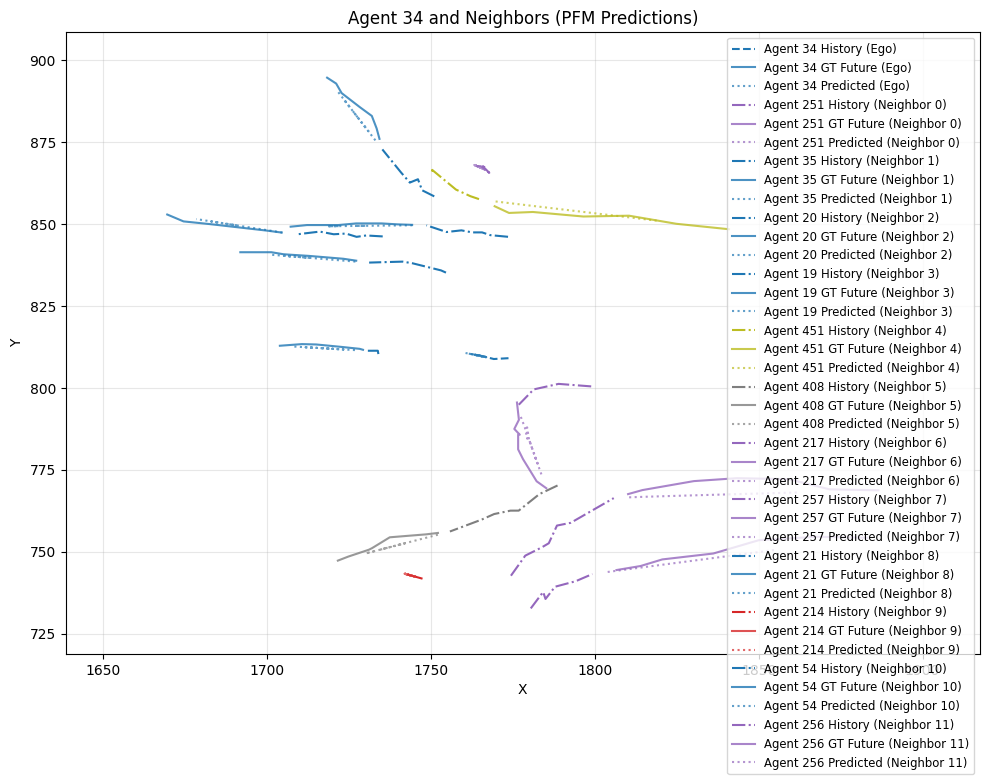

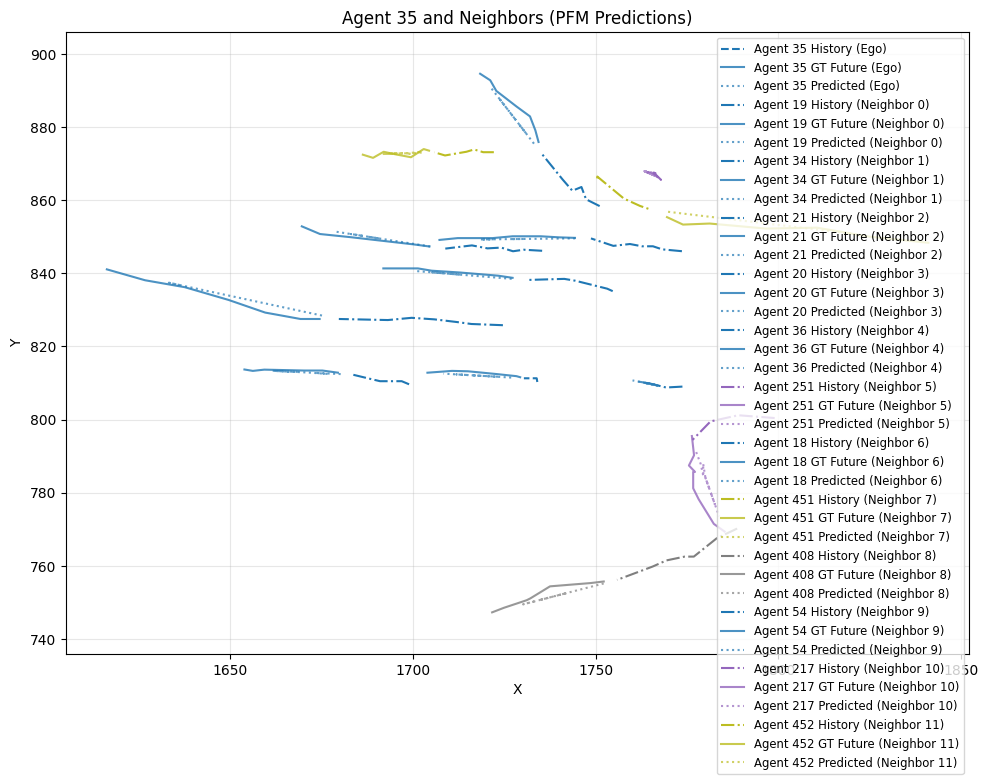

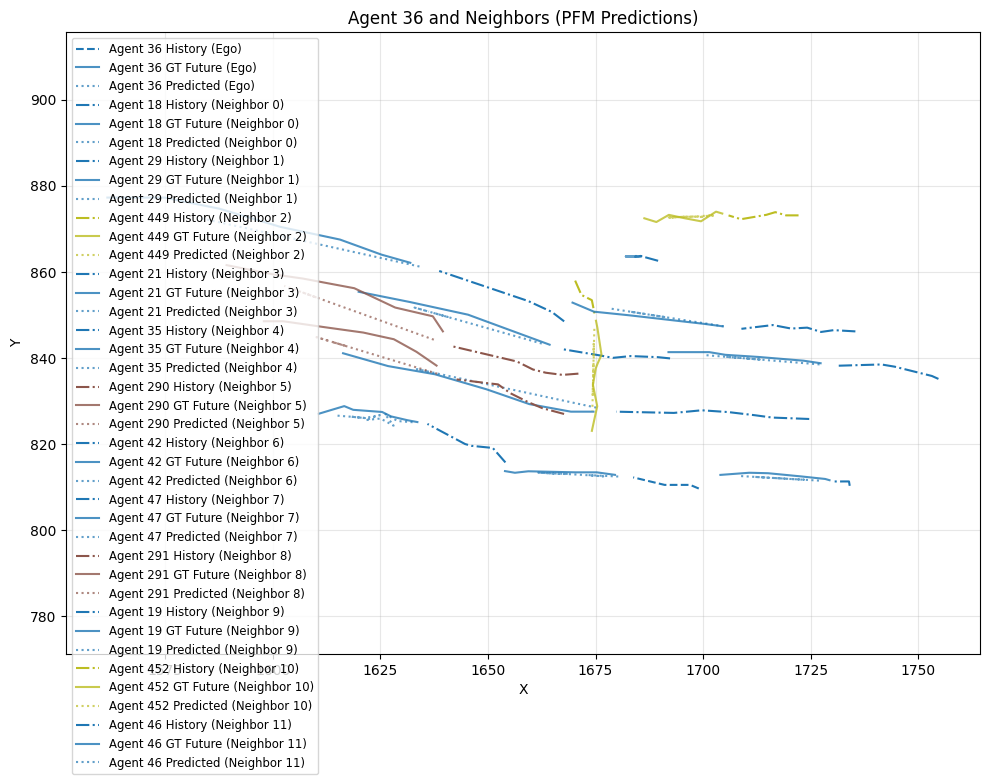

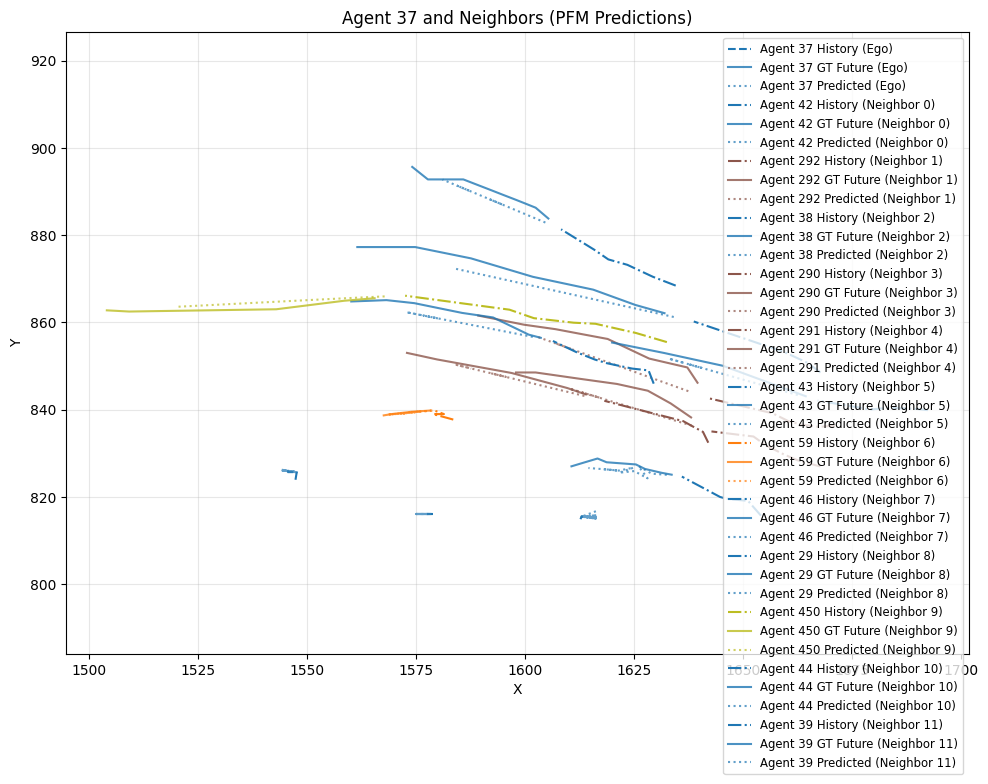

KeyboardInterrupt: 

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# =============================
# 2. Replace pred_function usage
# =============================
def plot_agents_individually_with_neighbors(dataset, device, sample_idx=0,
                                           prev=12, next=24,
                                           max_neighbors=12):

    history, future, neighbors, goals = dataset[sample_idx]

    if history.shape[0] == 0:
        print(f"No agents in sample {sample_idx}")
        return

    history_np = history.numpy()
    future_np = future.numpy()

    # ---- 🔥 Use PFM model for prediction ----
    with torch.no_grad():
        history_in = history.unsqueeze(0).to(device)     # shape: (1, num_agents, hist_len, 2)
        neighbors_in = neighbors.unsqueeze(0).to(device) # if your model needs it
        goals_in = goals.unsqueeze(0).to(device)         # Add goals to input
        pred_out, _, _ = model_no_learnable(history_in, neighbors_in, goals_in)   # Pass goals to model
        pred_np = pred_out.squeeze(0).cpu().numpy()      # (num_agents, future_len, 2)

    num_agents = history_np.shape[0]
    colors = plt.cm.get_cmap('tab10', num_agents)

    for ego_agent_idx in range(num_agents):
        plt.figure(figsize=(10, 8))

        def plot_traj(agent_idx, label_suffix, linestyle, color):
            traj_hist = history_np[agent_idx]
            traj_fut = future_np[agent_idx]
            traj_pred = pred_np[agent_idx]

            # Plot while skipping zeros
            mask_hist = ~np.all(traj_hist == 0, axis=1)
            mask_fut  = ~np.all(traj_fut == 0, axis=1)
            mask_pred = ~np.all(traj_pred == 0, axis=1)

            plt.plot(traj_hist[mask_hist, 0], traj_hist[mask_hist, 1], linestyle,
                     color=color, label=f'Agent {agent_idx} History {label_suffix}')
            plt.plot(traj_fut[mask_fut, 0], traj_fut[mask_fut, 1], '-',
                     color=color, alpha=0.8, label=f'Agent {agent_idx} GT Future {label_suffix}')
            plt.plot(traj_pred[mask_pred, 0], traj_pred[mask_pred, 1], ':',
                     color=color, alpha=0.7, label=f'Agent {agent_idx} Predicted {label_suffix}')

        # ---- Plot ego agent ----
        plot_traj(ego_agent_idx, '(Ego)', '--', colors(ego_agent_idx))

        # ---- Plot neighbors ----
        neighbor_positions = neighbors[ego_agent_idx]
        neighbor_count = 0

        for n_idx in range(neighbor_positions.shape[0]):
            if neighbor_count >= max_neighbors:
                break
            neigh_pos = neighbor_positions[n_idx]
            if np.all(neigh_pos.numpy() == 0):
                continue

            dists = np.linalg.norm(history_np[:, -1, :] - neigh_pos.numpy(), axis=1)
            closest_neighbor_idx = np.argmin(dists)

            if closest_neighbor_idx == ego_agent_idx:
                continue

            plot_traj(closest_neighbor_idx, f'(Neighbor {neighbor_count})',
                      '-.', colors(closest_neighbor_idx))
            neighbor_count += 1

        plt.title(f"Agent {ego_agent_idx} and Neighbors (PFM Predictions)")
        plt.xlabel('X'); plt.ylabel('Y')
        plt.legend(fontsize='small', loc='best')
        plt.axis('equal'); plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()




# =============================
# Example Dataset Loader (Your PFM_TrajectoryDataset class here)
# =============================
class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        all_frames = sorted(self.data.keys())
        valid_frames = []
        for frame in all_frames:
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)
        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]
        if frame not in self.data:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)
        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                goals[i] = self.data[frame][agent]

        neighbors_list = []
        for i, agent in enumerate(agents):
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        if neighbors_list:
            max_neighbors = 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list):
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        mask = torch.ones(history.shape[0], dtype=torch.bool)
        i = 0
        while i<history.shape[0]:
            for seq in range(history.shape[1]):
                if history[i,seq,0] == 0 and history[i,seq,1]==0:
                    mask[i] = False
            for seq in range(future.shape[1]):
                if future[i,seq,0] == 0 and future[i,seq,1]==0:
                    mask[i] = False
            i+=1
        history = history[mask]
        future = future[mask]
        neighbors = neighbors[mask]
        goals = goals[mask]

        return history, future, neighbors, goals

# =============================
# Usage Example
# =============================
dataset = PFM_TrajectoryDataset('/content/combined_annotations.csv', history_len=8, prediction_len=12)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plot_agents_individually_with_neighbors(dataset, device, sample_idx=0, prev=12, next=24)

## Plot Learnable

/tmp/ipython-input-35254376.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', num_agents)


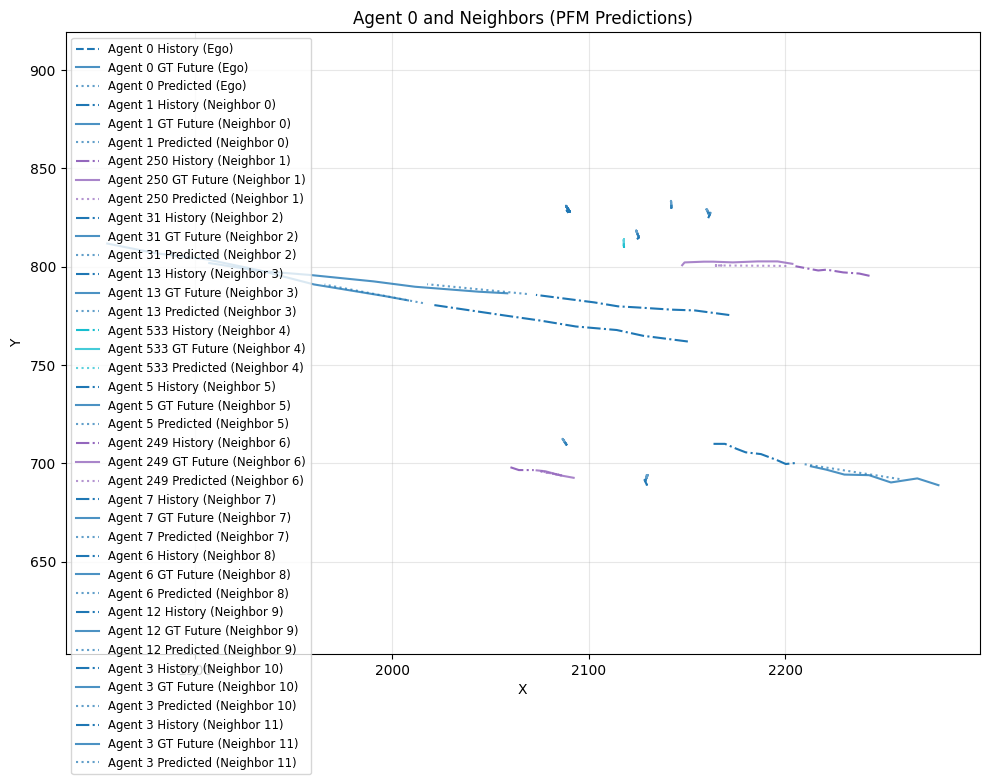

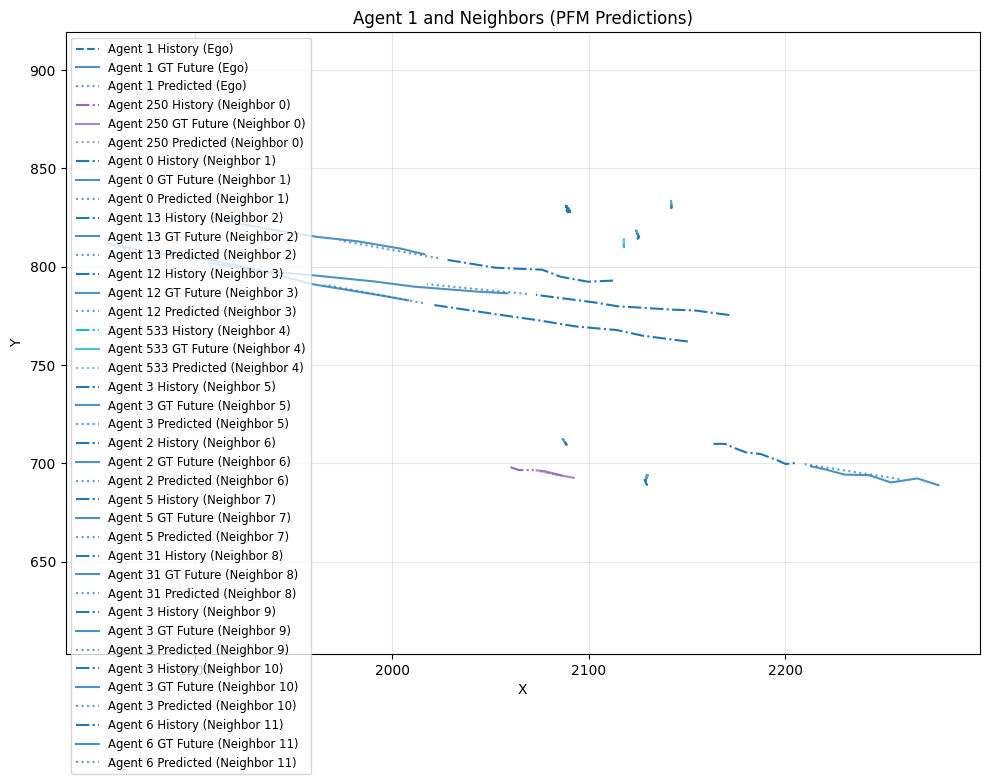

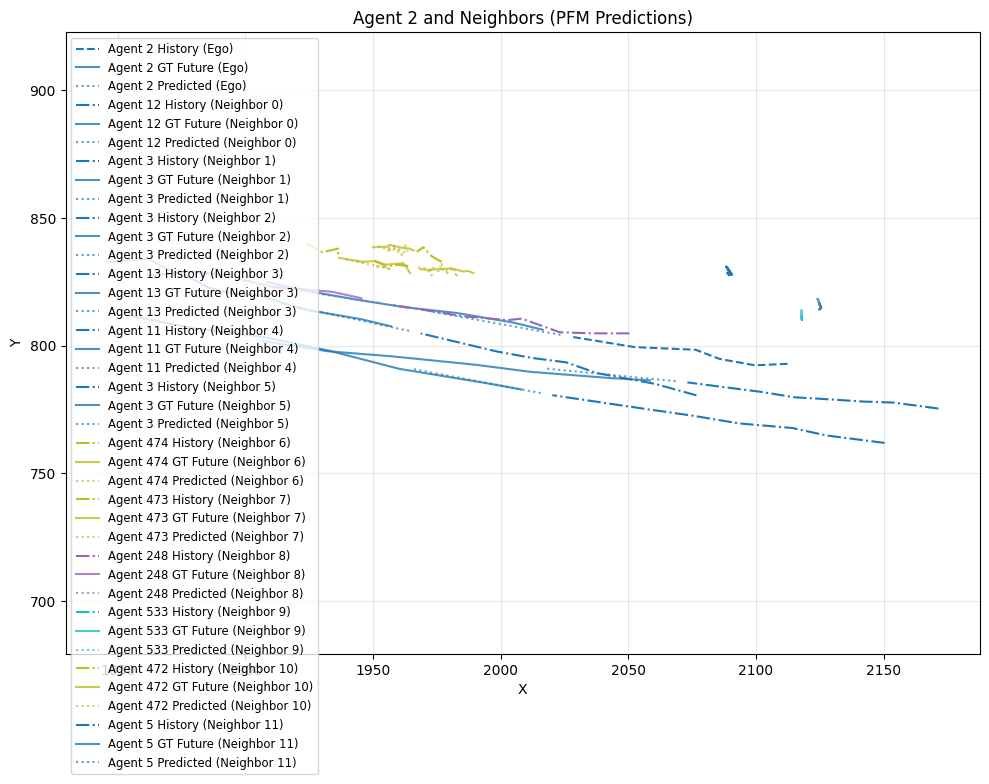

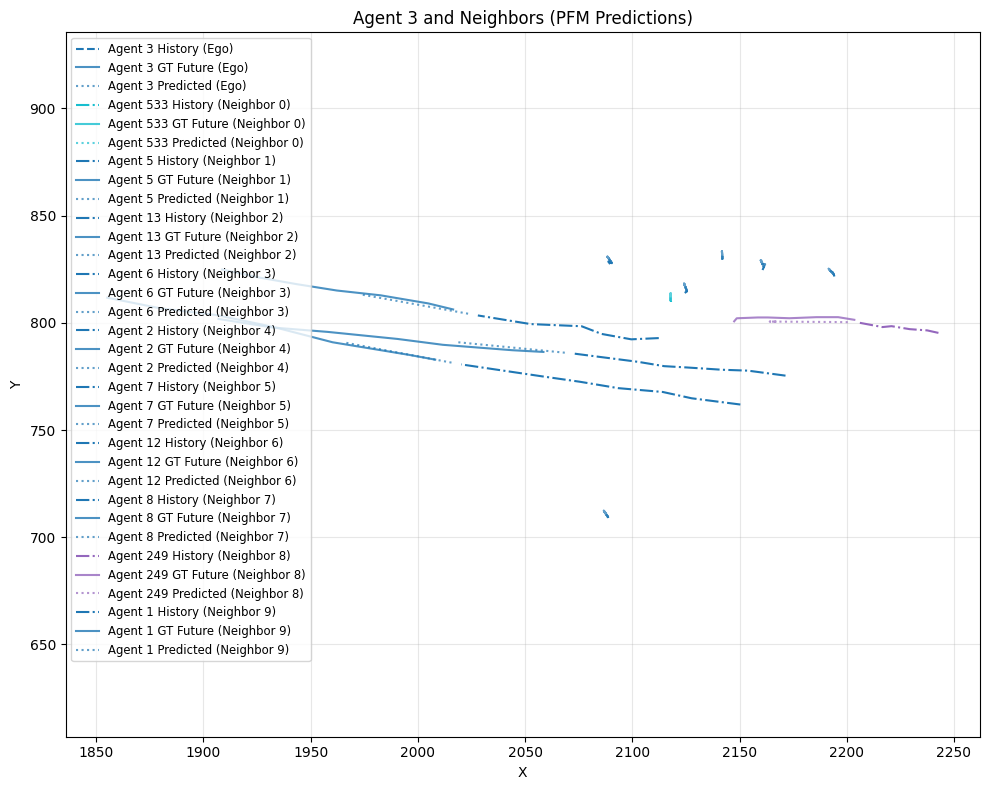

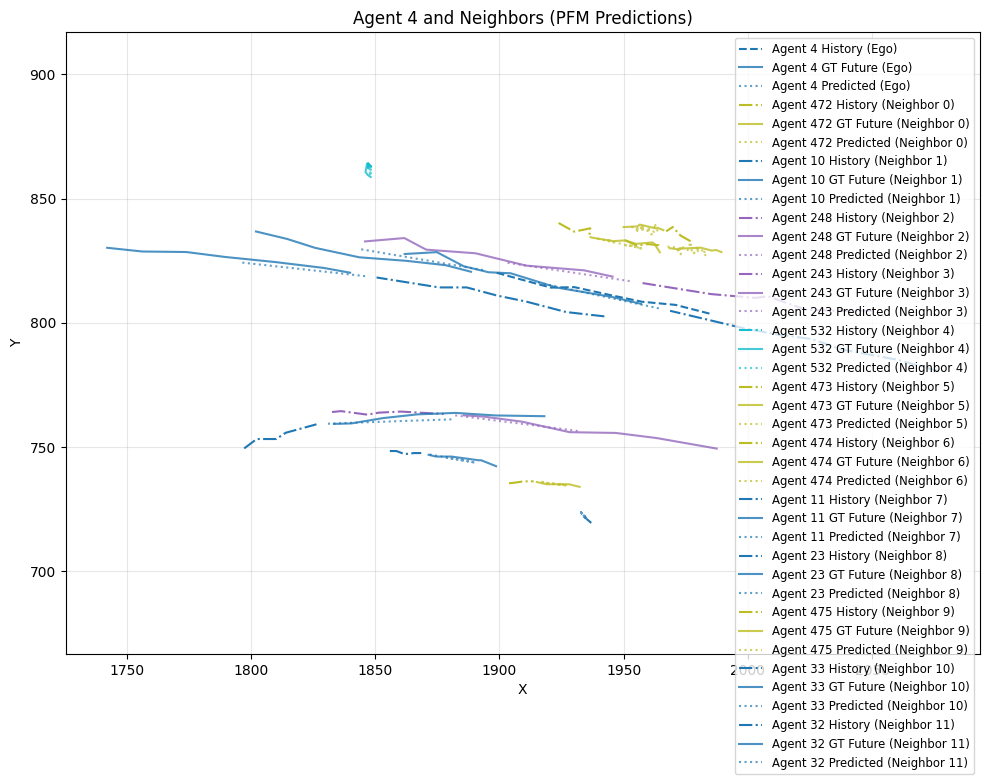

...

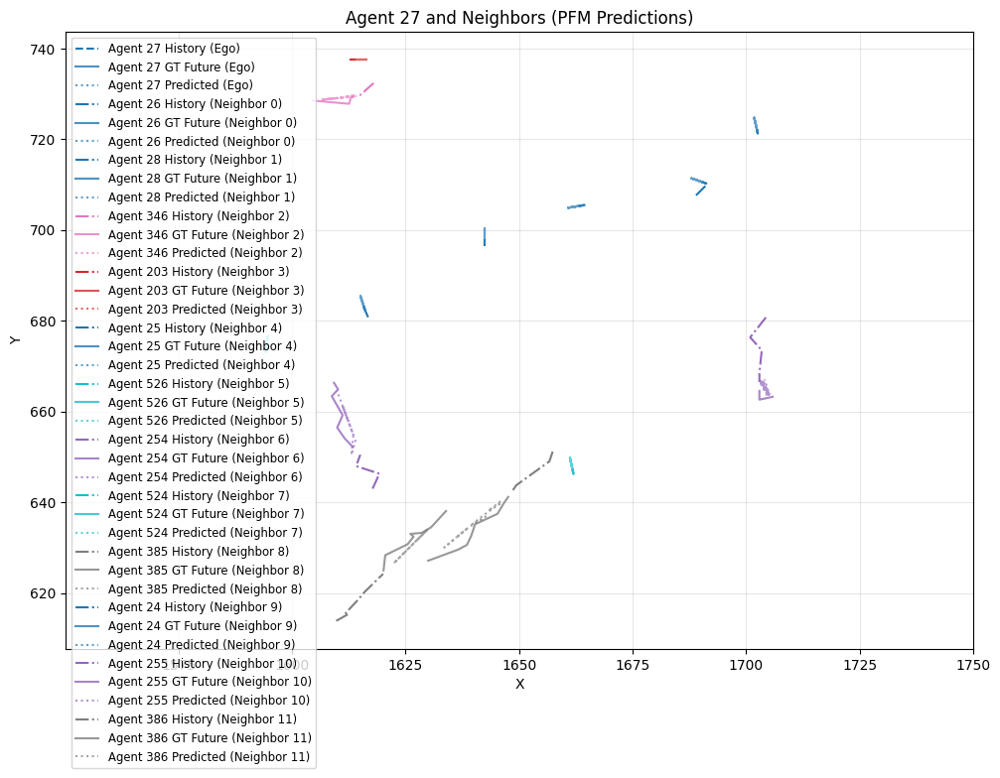

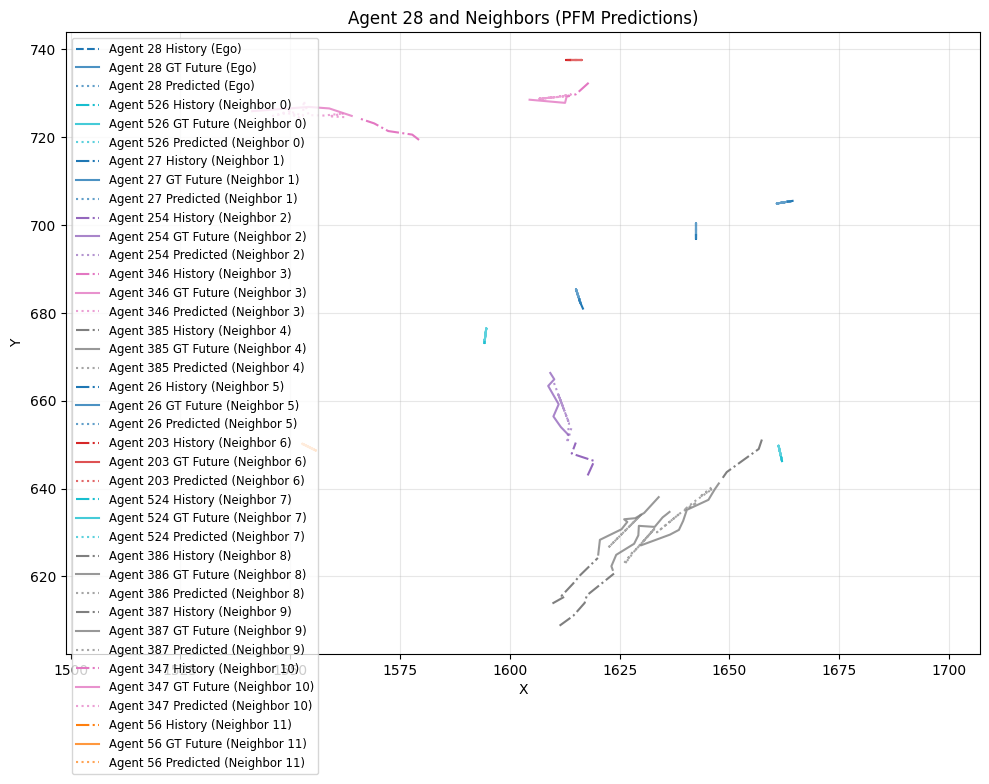

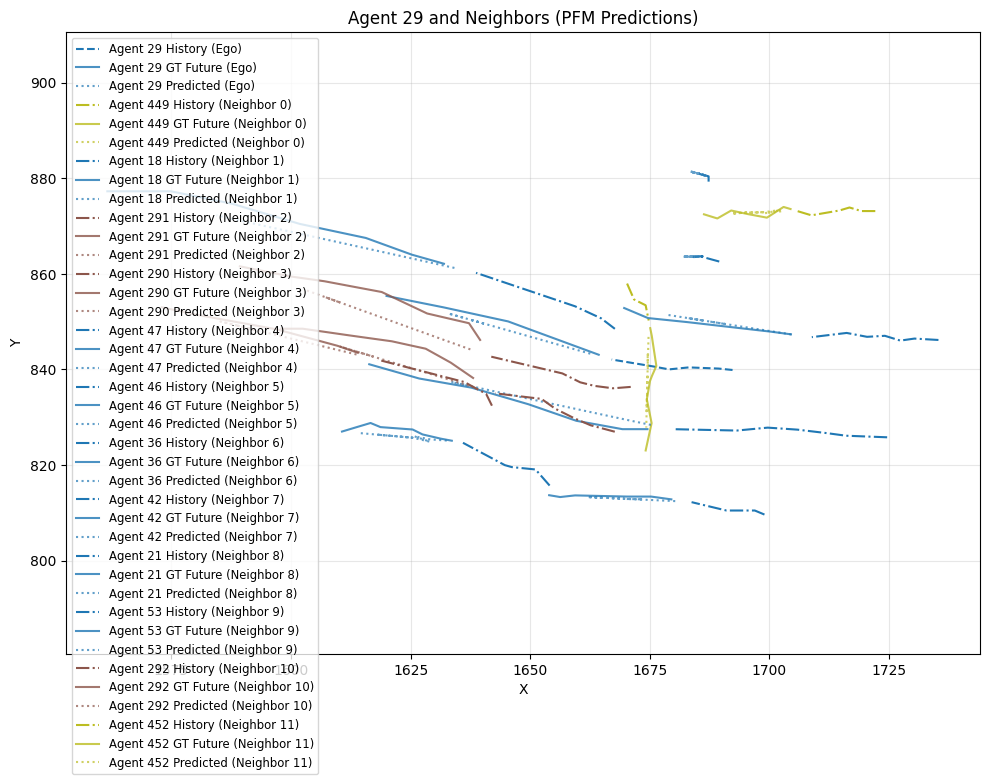

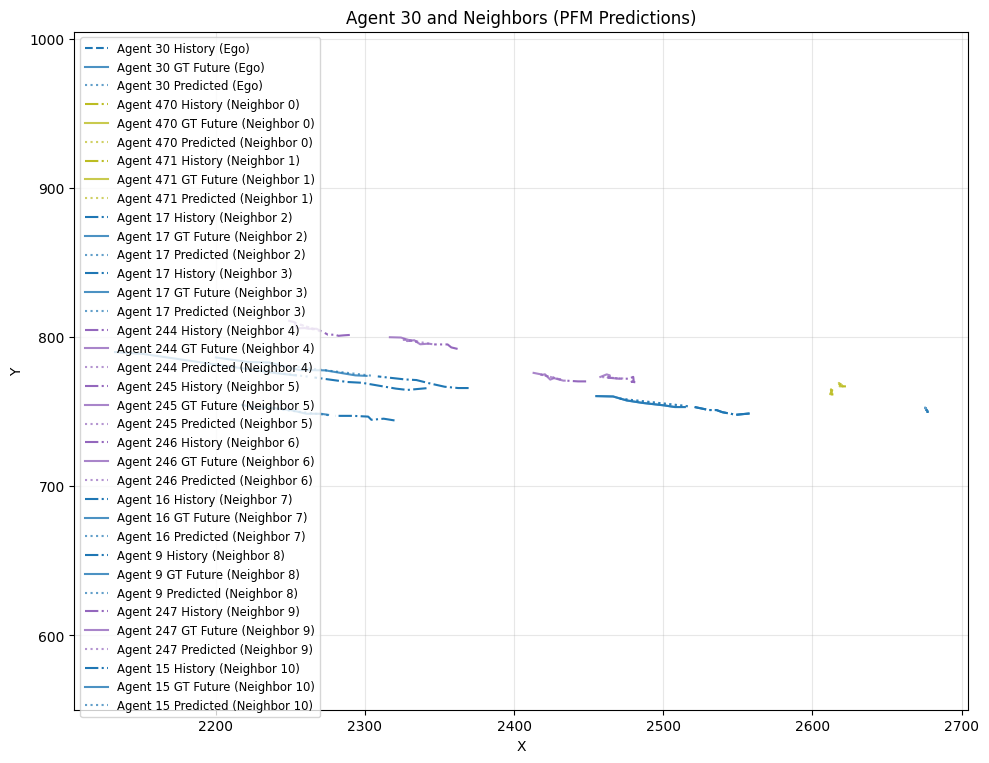

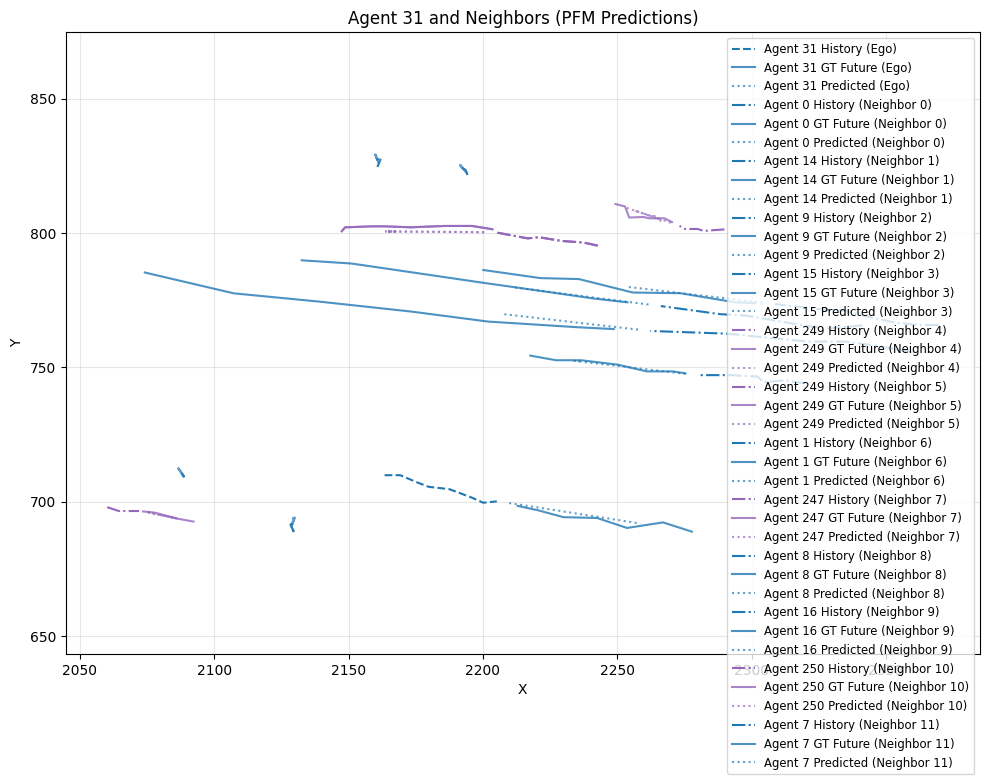

KeyboardInterrupt: 

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# =============================
# 2. Replace pred_function usage
# =============================
def plot_agents_individually_with_neighbors(dataset, device, sample_idx=0,
                                           prev=12, next=24,
                                           max_neighbors=12):

    history, future, neighbors, goals = dataset[sample_idx]

    if history.shape[0] == 0:
        print(f"No agents in sample {sample_idx}")
        return

    history_np = history.numpy()
    future_np = future.numpy()

    # ---- 🔥 Use PFM model for prediction ----
    with torch.no_grad():
        history_in = history.unsqueeze(0).to(device)     # shape: (1, num_agents, hist_len, 2)
        neighbors_in = neighbors.unsqueeze(0).to(device) # if your model needs it
        goals_in = goals.unsqueeze(0).to(device)         # Add goals to input
        pred_out, _, _ = model(history_in, neighbors_in, goals_in)   # Pass goals to model
        pred_np = pred_out.squeeze(0).cpu().numpy()      # (num_agents, future_len, 2)

    num_agents = history_np.shape[0]
    colors = plt.cm.get_cmap('tab10', num_agents)

    for ego_agent_idx in range(num_agents):
        plt.figure(figsize=(10, 8))

        def plot_traj(agent_idx, label_suffix, linestyle, color):
            traj_hist = history_np[agent_idx]
            traj_fut = future_np[agent_idx]
            traj_pred = pred_np[agent_idx]

            # Plot while skipping zeros
            mask_hist = ~np.all(traj_hist == 0, axis=1)
            mask_fut  = ~np.all(traj_fut == 0, axis=1)
            mask_pred = ~np.all(traj_pred == 0, axis=1)

            plt.plot(traj_hist[mask_hist, 0], traj_hist[mask_hist, 1], linestyle,
                     color=color, label=f'Agent {agent_idx} History {label_suffix}')
            plt.plot(traj_fut[mask_fut, 0], traj_fut[mask_fut, 1], '-',
                     color=color, alpha=0.8, label=f'Agent {agent_idx} GT Future {label_suffix}')
            plt.plot(traj_pred[mask_pred, 0], traj_pred[mask_pred, 1], ':',
                     color=color, alpha=0.7, label=f'Agent {agent_idx} Predicted {label_suffix}')

        # ---- Plot ego agent ----
        plot_traj(ego_agent_idx, '(Ego)', '--', colors(ego_agent_idx))

        # ---- Plot neighbors ----
        neighbor_positions = neighbors[ego_agent_idx]
        neighbor_count = 0

        for n_idx in range(neighbor_positions.shape[0]):
            if neighbor_count >= max_neighbors:
                break
            neigh_pos = neighbor_positions[n_idx]
            if np.all(neigh_pos.numpy() == 0):
                continue

            dists = np.linalg.norm(history_np[:, -1, :] - neigh_pos.numpy(), axis=1)
            closest_neighbor_idx = np.argmin(dists)

            if closest_neighbor_idx == ego_agent_idx:
                continue

            plot_traj(closest_neighbor_idx, f'(Neighbor {neighbor_count})',
                      '-.', colors(closest_neighbor_idx))
            neighbor_count += 1

        plt.title(f"Agent {ego_agent_idx} and Neighbors (PFM Predictions)")
        plt.xlabel('X'); plt.ylabel('Y')
        plt.legend(fontsize='small', loc='best')
        plt.axis('equal'); plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()




# =============================
# Example Dataset Loader (Your PFM_TrajectoryDataset class here)
# =============================
class PFM_TrajectoryDataset(torch.utils.data.Dataset):
    def __init__(self, file_path, history_len=8, prediction_len=12):
        self.data = self.load_data(file_path)
        self.history_len = history_len
        self.prediction_len = prediction_len
        self.valid_frames = self._get_valid_frames()

    def load_data(self, file_path):
        data = {}
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.strip().split(',')
                if len(parts) == 4:
                    frame, agent, x, y = map(float, parts)
                    frame, agent = int(frame), int(agent)
                    if frame not in data:
                        data[frame] = {}
                    data[frame][agent] = torch.tensor([x, y], dtype=torch.float32)
        return data

    def _get_valid_frames(self):
        all_frames = sorted(self.data.keys())
        valid_frames = []
        for frame in all_frames:
            history_start = frame - self.history_len + 1
            future_end = frame + self.prediction_len
            if history_start >= min(all_frames) and future_end <= max(all_frames):
                valid_frames.append(frame)
        return valid_frames

    def __len__(self):
        return len(self.valid_frames)

    def __getitem__(self, idx):
        frame = self.valid_frames[idx]
        if frame not in self.data:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        agents = list(self.data[frame].keys())
        num_agents = len(agents)
        if num_agents == 0:
            return (torch.zeros(0, self.history_len, 2),
                    torch.zeros(0, self.prediction_len, 2),
                    torch.zeros(0, 0, 2),
                    torch.zeros(0, 2))

        history = torch.zeros(num_agents, self.history_len, 2)
        future = torch.zeros(num_agents, self.prediction_len, 2)
        goals = torch.zeros(num_agents, 2)

        for i, agent in enumerate(agents):
            for t in range(self.history_len):
                hist_frame = frame - (self.history_len - 1 - t)
                if hist_frame in self.data and agent in self.data[hist_frame]:
                    history[i, t] = self.data[hist_frame][agent]
            for t in range(self.prediction_len):
                fut_frame = frame + t + 1
                if fut_frame in self.data and agent in self.data[fut_frame]:
                    future[i, t] = self.data[fut_frame][agent]
            non_zero_mask = torch.any(future[i] != 0, dim=1)
            if non_zero_mask.any():
                last_valid_idx = torch.where(non_zero_mask)[0][-1]
                goals[i] = future[i, last_valid_idx]
            else:
                goals[i] = self.data[frame][agent]

        neighbors_list = []
        for i, agent in enumerate(agents):
            agent_neighbors = []
            for other_agent in self.data[frame]:
                if other_agent != agent:
                    agent_neighbors.append(self.data[frame][other_agent])
            if agent_neighbors:
                neighbors_tensor = torch.stack(agent_neighbors)
            else:
                neighbors_tensor = torch.zeros(1, 2)
            neighbors_list.append(neighbors_tensor)

        if neighbors_list:
            max_neighbors = 12
            padded_neighbors = torch.zeros(num_agents, max_neighbors, 2)
            for i, neighbor_tensor in enumerate(neighbors_list):
                if neighbor_tensor.shape[0] > 0:
                    ego_pos = history[i, -1].unsqueeze(0)
                    dists = torch.norm(neighbor_tensor - ego_pos, dim=1)
                    sorted_idx = torch.argsort(dists)
                    sorted_neighbors = neighbor_tensor[sorted_idx]
                    top_neighbors = sorted_neighbors[:max_neighbors]
                    padded_neighbors[i, :top_neighbors.shape[0]] = top_neighbors
            neighbors = padded_neighbors
        else:
            neighbors = torch.zeros(num_agents, 1, 2)

        mask = torch.ones(history.shape[0], dtype=torch.bool)
        i = 0
        while i<history.shape[0]:
            for seq in range(history.shape[1]):
                if history[i,seq,0] == 0 and history[i,seq,1]==0:
                    mask[i] = False
            for seq in range(future.shape[1]):
                if future[i,seq,0] == 0 and future[i,seq,1]==0:
                    mask[i] = False
            i+=1
        history = history[mask]
        future = future[mask]
        neighbors = neighbors[mask]
        goals = goals[mask]

        return history, future, neighbors, goals

# =============================
# Usage Example
# =============================
dataset = PFM_TrajectoryDataset('/content/combined_annotations.csv', history_len=8, prediction_len=12)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plot_agents_individually_with_neighbors(dataset, device, sample_idx=0, prev=12, next=24)